Meta's **SAM3** introduces **text-based prompting** for segmentation - just describe what you want to segment. This notebook shows:

1. **SAM3 Text Prompts**: Segment cars, people, dogs using natural language
2. **SAM3 Box Prompts**: Segment specific regions
3. **Gemini + SAM3**: Let Gemini analyze an image, then segment what it finds

## Setup

In [36]:
# SAM3 requires transformers from source
# !pip install -q git+https://github.com/huggingface/transformers.git
# !pip install -q torch pillow requests matplotlib google-genai

In [37]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import requests
from io import BytesIO
from transformers import Sam3Processor, Sam3Model

device = "cuda" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu"
model = Sam3Model.from_pretrained("facebook/sam3").to(device)
processor = Sam3Processor.from_pretrained("facebook/sam3")

%config InlineBackend.figure_format = 'retina'

Loading weights:   0%|          | 0/1468 [00:00<?, ?it/s]

In [38]:
def load_image(url):
    return Image.open(BytesIO(requests.get(url).content)).convert("RGB")

def overlay_masks(image, masks, alpha=0.5):
    """Overlay colored masks on image."""
    image = image.convert("RGBA")
    cmap = plt.cm.get_cmap("tab10")
    for i, mask in enumerate(masks.cpu().numpy()):
        color = tuple(int(c * 255) for c in cmap(i % 10)[:3])
        mask_img = Image.fromarray((mask * 255).astype(np.uint8))
        overlay = Image.new("RGBA", image.size, color + (0,))
        overlay.putalpha(mask_img.point(lambda v: int(v * alpha)))
        image = Image.alpha_composite(image, overlay)
    return image

def segment(image, text=None, boxes=None, box_labels=None, threshold=0.4):
    """Segment image with text or box prompts."""
    inputs = processor(
        images=image, 
        text=text,
        input_boxes=boxes,
        input_boxes_labels=box_labels,
        return_tensors="pt"
    ).to(device)
    
    with torch.no_grad():
        outputs = model(**inputs)
    
    return processor.post_process_instance_segmentation(
        outputs, threshold=threshold, mask_threshold=0.5,
        target_sizes=inputs.get("original_sizes").tolist()
    )[0]

## Text Prompts: Street Scene

Segment cars and people using natural language.

Found 18 cars | scores: ['0.60', '0.63', '0.82', '0.89', '0.43', '0.89', '0.56', '0.94', '0.75', '0.84', '0.65', '0.85', '0.88', '0.70', '0.47', '0.90', '0.62', '0.83']


/var/folders/1x/wmgn24mn1bbd2vgbqlk98tbc0000gn/T/ipykernel_47756/1973769679.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap("tab10")


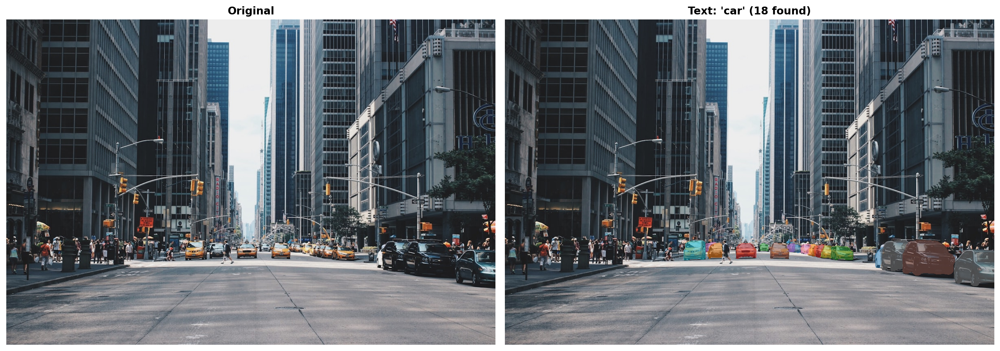

In [39]:
street_url = "https://images.unsplash.com/photo-1449824913935-59a10b8d2000?w=1200"
street = load_image(street_url)

# Segment cars
results_cars = segment(street, text="car")

# SAM3 returns: masks (N x H x W), boxes (N x 4), scores
print(f"Found {len(results_cars['masks'])} cars | scores: {[f'{s:.2f}' for s in results_cars['scores'].tolist()]}")

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
axes[0].imshow(street)
axes[0].set_title("Original", fontweight='bold')
axes[0].axis('off')

axes[1].imshow(overlay_masks(street, results_cars['masks']))
axes[1].set_title(f"Text: 'car' ({len(results_cars['masks'])} found)", fontweight='bold')
axes[1].axis('off')
plt.tight_layout()
plt.show()

Found 25 people


/var/folders/1x/wmgn24mn1bbd2vgbqlk98tbc0000gn/T/ipykernel_47756/1973769679.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap("tab10")


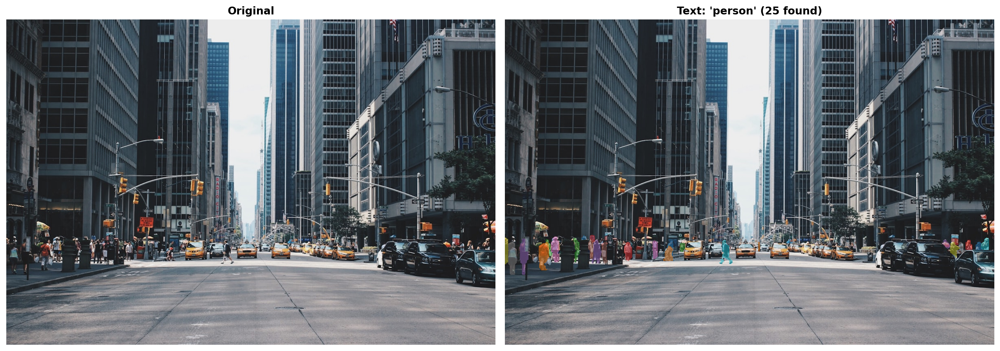

In [40]:
# Segment people
results_people = segment(street, text="person")
print(f"Found {len(results_people['masks'])} people")

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
axes[0].imshow(street)
axes[0].set_title("Original", fontweight='bold')
axes[0].axis('off')

axes[1].imshow(overlay_masks(street, results_people['masks']))
axes[1].set_title(f"Text: 'person' ({len(results_people['masks'])} found)", fontweight='bold')
axes[1].axis('off')
plt.tight_layout()
plt.show()

## Box Prompt

Segment only objects in a specific region - here, the bottom-right corner of the street scene.

/var/folders/1x/wmgn24mn1bbd2vgbqlk98tbc0000gn/T/ipykernel_47756/1973769679.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap("tab10")


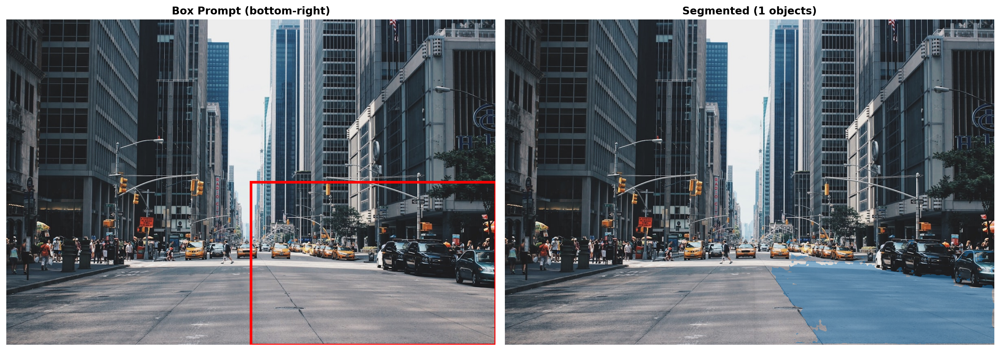

In [47]:
w, h = street.size
box = [int(w*0.5), int(h*0.5), w, h]  # Bottom-right corner

results_box = segment(street, boxes=[[box]], box_labels=[[1]])

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

axes[0].imshow(street)
rect = patches.Rectangle((box[0], box[1]), box[2]-box[0], box[3]-box[1],
                          linewidth=3, edgecolor='red', facecolor='none')
axes[0].add_patch(rect)
axes[0].set_title("Box Prompt (bottom-right)", fontweight='bold')
axes[0].axis('off')

axes[1].imshow(overlay_masks(street, results_box['masks']))
axes[1].set_title(f"Segmented ({len(results_box['masks'])} objects)", fontweight='bold')
axes[1].axis('off')
plt.tight_layout()
plt.show()

## Gemini + SAM3 Pipeline

Let Gemini analyze an image and tell SAM3 what to segment.

In [43]:
from google import genai
import json

gemini = genai.Client(api_key=os.environ['GEMINI_API_KEY'])
GEMINI_MODEL = "models/gemini-3-pro-preview"

def gemini_analyze(image, client):
    """Ask Gemini what objects are in the image."""
    prompt = """List 3-4 main objects in this image that could be segmented.
Return JSON: {"objects": ["object1", "object2", ...], "description": "one sentence"}
Return ONLY JSON."""
    
    response = client.models.generate_content(model=GEMINI_MODEL, contents=[prompt, image])
    text = response.text.strip()
    if text.startswith('```'):
        text = '\n'.join(text.split('\n')[1:-1])
    return json.loads(text)

In [44]:
# Load a scene image
scene_url = "https://images.unsplash.com/photo-1558618666-fcd25c85cd64?w=1200"
scene = load_image(scene_url)

# Gemini analyzes
analysis = gemini_analyze(scene, gemini)
print(f"{analysis['description']}")
print(f"Objects: {analysis['objects']}")

A close-up view of a hand gripping a wooden handle attached to a machine, with a blurred man and a bright lamp in the background.
Objects: ['hand', 'wooden handle', 'man', 'light fixture']


In [45]:
# SAM3 segments each object
all_results = {}
for obj in analysis['objects']:
    all_results[obj] = segment(scene, text=obj)

print({obj: len(r['masks']) for obj, r in all_results.items()})

{'hand': 1, 'wooden handle': 1, 'man': 1, 'light fixture': 3}


/var/folders/1x/wmgn24mn1bbd2vgbqlk98tbc0000gn/T/ipykernel_47756/1973769679.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap("tab10")


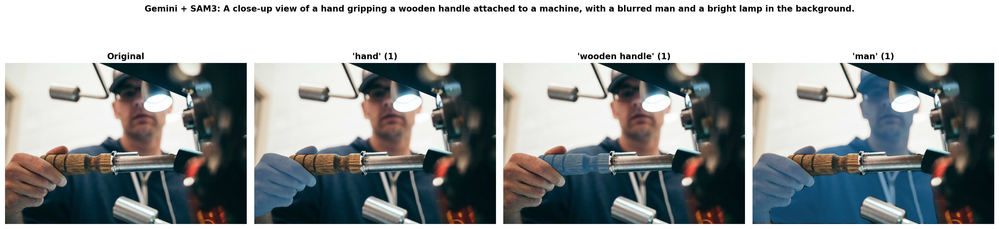

In [46]:
# Visualize results
objects = [o for o, r in all_results.items() if len(r['masks']) > 0]
n = min(len(objects) + 1, 4)

fig, axes = plt.subplots(1, n, figsize=(5*n, 5))

axes[0].imshow(scene)
axes[0].set_title("Original", fontweight='bold')
axes[0].axis('off')

for i, obj in enumerate(objects[:3]):
    axes[i+1].imshow(overlay_masks(scene, all_results[obj]['masks']))
    axes[i+1].set_title(f"'{obj}' ({len(all_results[obj]['masks'])})", fontweight='bold')
    axes[i+1].axis('off')

plt.suptitle(f"Gemini + SAM3: {analysis['description']}", fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig("sam3_demo.png", dpi=150, bbox_inches='tight')
plt.show()

## Summary

- **SAM3 Text Prompts**: Segment by description ("car", "person", "dog")
- **SAM3 Box Prompts**: Segment specific regions
- **Gemini + SAM3**: Automatic intelligent segmentation pipeline

## References

- [SAM3 on Hugging Face](https://huggingface.co/facebook/sam3)
- [SAM3 GitHub](https://github.com/facebookresearch/sam3)
- [Gemini API](https://ai.google.dev/gemini-api/docs)